# MEDSYNTH: Brain tumor image classificataion and image generation using Conditional GANs

## PART 1: Image classification before augmenting our data with generated images

In [1]:
!pip install git+https://github.com/quadeer15sh/GANForge.git

  Cloning https://github.com/quadeer15sh/GANForge.git to /tmp/pip-req-build-3zlhsgz1
  Running command git clone --filter=blob:none --quiet https://github.com/quadeer15sh/GANForge.git /tmp/pip-req-build-3zlhsgz1
  Resolved https://github.com/quadeer15sh/GANForge.git to commit 220026556492439528f0abe66282cdb555ebc548
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for GANForge: filename=GANForge-0.0.1-py3-none-any.whl size=12609 sha256=1821c5e886a1cd833264e45e50554b8ca0df88c8a4ff011b690d17257fb5990e
  Stored in directory: /tmp/pip-ephem-wheel-cache-md7yehxa/wheels/6c/08/5a/9bd6b08b06cd39c7f767fa8a45e67bd6e8b8fb749d55905901
Successfully built GANForge


In [2]:
# Import all the libraries
import os 
import numpy as np
import pandas as pd
import tensorflow as tf
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score,ConfusionMatrixDisplay,classification_report


/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [3]:
np.random.seed(42)

### Exploratory Data Analysis

In [4]:
# lets take the image file from each directory
glioma_tumor="/kaggle/input/brain-tumors-256x256/Data/glioma_tumor"
glioma_files = os.listdir(glioma_tumor)

meningioma_tumor="/kaggle/input/brain-tumors-256x256/Data/meningioma_tumor"
meningioma_files = os.listdir(meningioma_tumor)

normal="/kaggle/input/brain-tumors-256x256/Data/normal"
normal_files = os.listdir(normal)


pituitary_tumor="/kaggle/input/brain-tumors-256x256/Data/pituitary_tumor"
pituitary_files= os.listdir(pituitary_tumor)

### Visualize the number of images in each directory

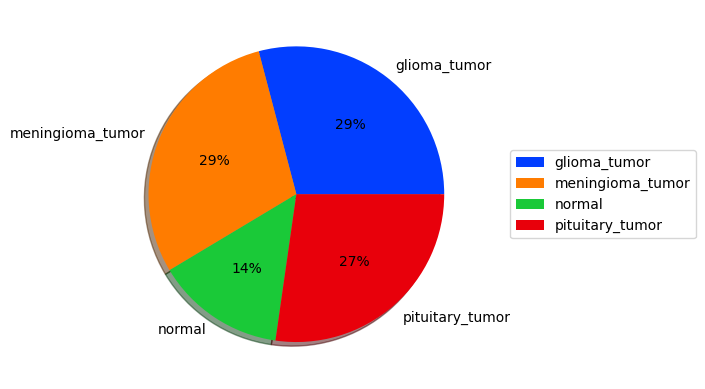

In [5]:
# declaring data 
data = [len(glioma_files), len(meningioma_files), len(normal_files),len(pituitary_files)] 
keys = ['glioma_tumor', 'meningioma_tumor', 'normal', 'pituitary_tumor'] 

# define Seaborn color palette to use 
palette_color = sns.color_palette('bright') 

# plotting data on chart 
plt.pie(data, labels=keys, colors=palette_color,autopct='%.0f%%', shadow=True) 
plt.legend(loc='center right',  bbox_to_anchor=(1.6, 0.5))

# displaying chart 
plt.show() 


### Lets create the Training data 

In [6]:
# Lets create the Training data 
image_directory="/kaggle/input/brain-tumors-256x256/Data"
batch_size = 32
img_height = 128
img_width = 128
train_data = tf.keras.utils.image_dataset_from_directory(image_directory,
                                                         validation_split=0.2,
                                                         seed=123,
                                                         subset="training",
                                                         image_size=(img_height, img_width),
                                                         batch_size=batch_size)

Found 3096 files belonging to 4 classes.
Using 2477 files for training.


### Print the name of four different classes 

In [7]:
# Print the name of four different classes 
class_names =train_data.class_names
print(class_names)

['glioma_tumor', 'meningioma_tumor', 'normal', 'pituitary_tumor']


In [8]:
# Lets check how many batches are created in training data
total_images_train_data=2477
num_batches=total_images_train_data/32
num_batches

77.40625

In [9]:
len(train_data)

78

> Here we can see that there are total 78 batches are created and each batch contain 32 images 

### Lets Check the shape and label of image in first batch of training data

In [10]:
# Lets check the shape and label of single image in first batch of training data
for image_batch, labels_batch in train_data.take(1):
    print(f"Shape of the image in one batch is: {image_batch.shape}")
    print(f"Total labels contained in one batch:{labels_batch.shape}")
    print(f"lable of image is:{class_names[labels_batch[0]]}")
    

Shape of the image in one batch is: (32, 128, 128, 3)
Total labels contained in one batch:(32,)
lable of image is:meningioma_tumor


So, here we can see that the batch size is 32 and shape of image is (224,224,3) and there are 32 corresponding labels.

### Create the Validation data 

In [11]:
# Lets create the Validation data 
val_data = tf.keras.utils.image_dataset_from_directory(image_directory,
                                                       validation_split=0.2,
                                                       subset="validation",
                                                       seed=123,
                                                       image_size=(img_height, img_width),
                                                       batch_size=batch_size)

Found 3096 files belonging to 4 classes.
Using 619 files for validation.


### Visualising the images

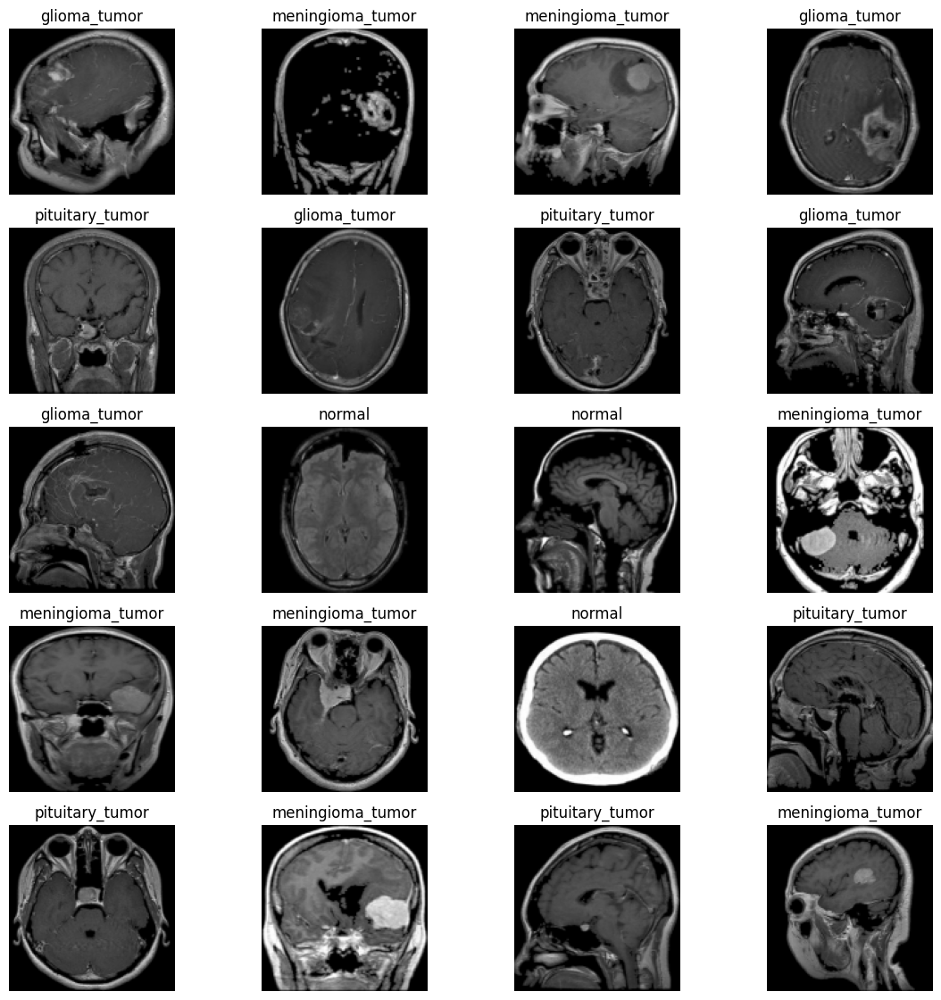

In [12]:
# See the images of tumor
plt.figure(figsize=(14, 14))
for images, labels in train_data.take(1):
    for i in range(20):
        ax = plt.subplot(5, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

### Transfer Learning-- We use the pretrained model ResNet50 architecture to train the model

In [13]:
base_model =tf.keras.applications.resnet.ResNet50(include_top=False)
for layer in base_model.layers[:15]:
    layer.trainable=False
inputs = tf.keras.layers.Input(shape=(128, 128,3), name="input_layer")

94765736/94765736 [==============================] - 4s 0us/step


In [14]:
x = base_model(inputs)
print(f"Shape after base_model: {x.shape}")

Shape after base_model: (None, 4, 4, 2048)


In [15]:
 #Average pool the outputs of the base model (aggregate all the most important information, reduce number of computations)
x = tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)
x=tf.keras.layers.Flatten()(x)
x=tf.keras.layers.Dense(512, activation="relu")(x)
x=tf.keras.layers.Dropout(0.5)(x)
outputs=tf.keras.layers.Dense(4, activation="softmax",name="output_layer")(x)
model_1= tf.keras.Model(inputs, outputs, name="model")


In [16]:
# Compile the model
model_1.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(), # different loss function for multiclass classifcation
              optimizer=tf.keras.optimizers.Adam(lr=0.001),
              metrics=["accuracy"]
             )

In [17]:
learning_rate_reduction=tf.keras.callbacks.ReduceLROnPlateau(monitor="val_loss",patience=2,factor=0.5, min_lr=0.00001,verbose =1)
Early_Stopping= tf.keras.callbacks.EarlyStopping(monitor="val_loss",patience=5, restore_best_weights=True)

In [18]:
history= model_1.fit(train_data, epochs=20, validation_data= val_data,callbacks=[Early_Stopping,learning_rate_reduction], verbose=1)


Epoch 1/15
78/78 [==============================] - 43s 101ms/step - loss: 0.8369 - accuracy: 0.7388 - val_loss: 3424.4458 - val_accuracy: 0.2843 - lr: 0.0010
Epoch 2/15
78/78 [==============================] - 5s 66ms/step - loss: 0.4658 - accuracy: 0.8599 - val_loss: 4.2794 - val_accuracy: 0.6349 - lr: 0.0010
Epoch 3/15
78/78 [==============================] - 5s 65ms/step - loss: 0.3421 - accuracy: 0.8966 - val_loss: 1.6766 - val_accuracy: 0.8304 - lr: 0.0010
Epoch 4/15
78/78 [==============================] - 5s 64ms/step - loss: 0.3745 - accuracy: 0.8845 - val_loss: 0.4723 - val_accuracy: 0.8724 - lr: 0.0010
Epoch 5/15
78/78 [==============================] - 5s 65ms/step - loss: 0.1862 - accuracy: 0.9394 - val_loss: 0.3049 - val_accuracy: 0.9095 - lr: 0.0010
Epoch 6/15
78/78 [==============================] - 5s 64ms/step - loss: 0.1058 - accuracy: 0.9625 - val_loss: 0.3254 - val_accuracy: 0.8950 - lr: 0.0010
Epoch 7/15
77/78 [============================>.] - ETA: 0s - loss: 0.0

### Model evaluation

In [19]:
loss, accuracy= model_1.evaluate(val_data)
print(f"loss is:{loss}")
print(f"accuacy is:{accuracy}")

20/20 [==============================] - 1s 24ms/step - loss: 0.4137 - accuracy: 0.9386
loss is:0.41369304060935974
accuacy is:0.9386106729507446


In [20]:
history_df= pd.DataFrame(history.history)
history_df.tail()

,loss,accuracy,val_loss,val_accuracy,lr
10,0.018003,0.994348,0.236121,0.956381,0.00050
11,0.030255,0.990311,0.340171,0.927302,0.00050
12,0.017906,0.994752,0.262804,0.943457,0.00050
13,0.009426,0.996770,0.265219,0.945073,0.00025
14,0.006161,0.998789,0.413693,0.938611,0.00025


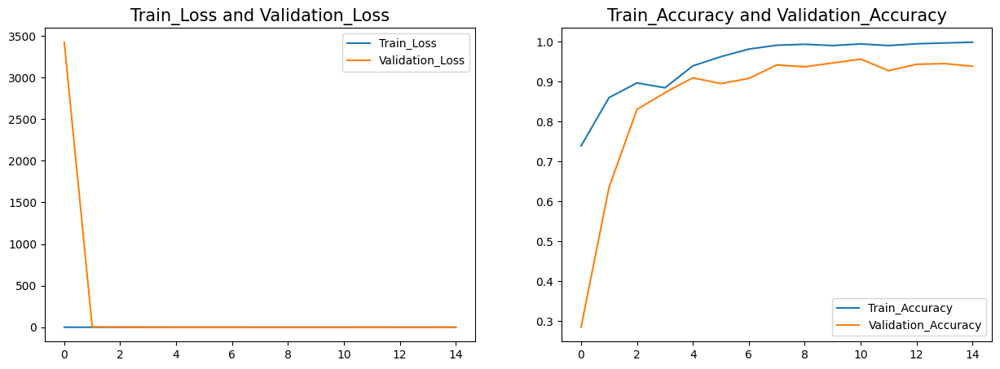

In [21]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(history_df['loss'],label='Train_Loss')
plt.plot(history_df['val_loss'],label='Validation_Loss')
plt.title('Train_Loss and Validation_Loss',fontsize=15)
plt.legend()


plt.subplot(1,2,2)
plt.plot(history_df['accuracy'],label='Train_Accuracy')
plt.plot(history_df['val_accuracy'],label='Validation_Accuracy')
plt.title('Train_Accuracy and Validation_Accuracy',fontsize=15)
plt.legend()
plt.show()

In [22]:
x_val=[]
y_val=[]
y_pred=[]

for images, labels in val_data:
    x_val.extend(images.numpy())
    y_val.extend(labels.numpy())
    

predictions=model_1.predict(np.array(x_val))
for i in predictions:
    y_pred.append(np.argmax(i))

20/20 [==============================] - 1s 21ms/step


F1-Score:[0.9438177101567666]
Precision:[0.9461725760482946]
Recall:[0.9457426326362361]
Classification_Report
-----------------------
              precision    recall  f1-score   support

           0       0.99      0.85      0.91       184
           1       0.87      0.97      0.92       179
           2       0.96      0.99      0.98        81
           3       0.97      0.98      0.97       175

    accuracy                           0.94       619
   macro avg       0.95      0.95      0.94       619
weighted avg       0.94      0.94      0.94       619

Confusion_Matrix
----------------------


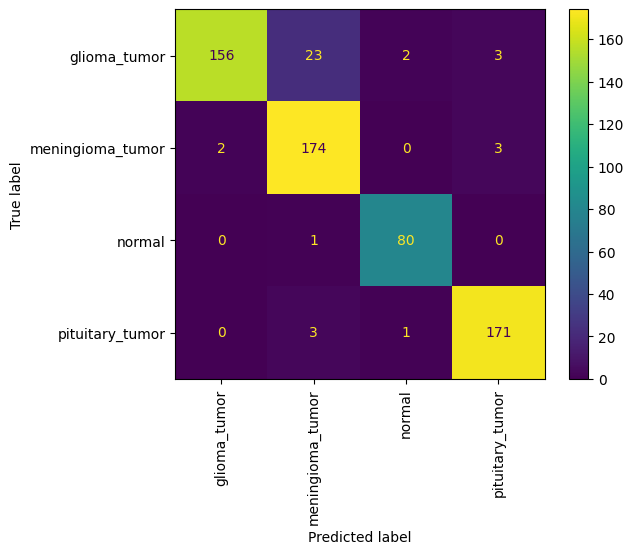

In [23]:
f1_scores=[]
precision_scores=[]
recall_scores=[]

f1_scores.append(f1_score(y_pred, y_val, average="macro"))
precision_scores.append(precision_score(y_pred, y_val, average="macro"))
recall_scores.append(recall_score(y_pred, y_val, average="macro"))


# Print the Results
print(f"F1-Score:{f1_scores}")
print(f"Precision:{precision_scores}")
print(f"Recall:{recall_scores}")




print("Classification_Report")
print("-----------------------")
print(classification_report(y_val,y_pred))
print("Confusion_Matrix")
print("----------------------")
ConfusionMatrixDisplay.from_predictions(y_val, y_pred, display_labels=class_names, xticks_rotation="vertical")
plt.show()

In [24]:
model_name=["ResNet50"]
result_df= pd.DataFrame({"F1_Score":f1_scores, "Precision_Score":precision_scores, "Recall_Score":recall_scores}, index=model_name)
result_df= result_df.T.sort_values(by="ResNet50", ascending=False)
result_df

,ResNet50
Precision_Score,0.946173
Recall_Score,0.945743
F1_Score,0.943818


## Part 2: Generating new images using Conditional Generative Adversarial Networks:

In [46]:
import pandas as pd
import numpy as np
from GANForge.conditional_dcgan import ConditionalDCGAN
from GANForge.callbacks import ConditionalGANVisualization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy, CategoricalCrossentropy, MeanSquaredError
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
import matplotlib.pyplot as plt

In [26]:
main_directory= '/kaggle/input/brain-tumors-256x256/Data'
new_directory = '/kaggle/working/saved'

### resizing images to 128 pixels

In [27]:
import os
import cv2

def load_images_and_resize(main_directory, new_directory, target_size):
    for class_folder in os.listdir(main_directory):
        class_path = os.path.join(main_directory, class_folder)
        if os.path.isdir(class_path):
            target_directory = os.path.join(new_directory, class_folder)
            os.makedirs(target_directory, exist_ok=True)

            for filename in os.listdir(class_path):
                img_dir = os.path.join(class_path, filename)
                try:
                    img = cv2.imread(img_dir)
                    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                    img = cv2.resize(img, target_size)
                    cv2.imwrite(os.path.join(target_directory, filename), img)
                except Exception as e:
                    print(f"Error processing {filename}: {e}")


os.makedirs(new_directory, exist_ok=True)

target_size = (128, 128)
load_images_and_resize(main_directory, new_directory, target_size)


### Image pre-processing and visualisation

In [28]:
img_size = 128
batch_size = 32
latent_dim = 256

def scaling(x):
    x = (x-127.5)/127.5 

    return x

datagen = ImageDataGenerator(preprocessing_function=scaling)

data_generator = datagen.flow_from_directory('/kaggle/working/saved',  
                                             target_size=(img_size, img_size), 
                                             batch_size=batch_size,
                                             shuffle=True,
                                             class_mode='sparse')  

Found 3096 images belonging to 4 classes.


In [29]:
labels = list(data_generator.class_indices.keys())
images = data_generator.__next__()

In [30]:
labels

['glioma_tumor', 'meningioma_tumor', 'normal', 'pituitary_tumor']

In [31]:
glioma_tumor_dir = '/kaggle/working/saved/glioma_tumor'
meningioma_tumor_dir = '/kaggle/working/saved/meningioma_tumor'
normal_dir = '/kaggle/working/saved/normal'
pituitary_tumor_dir = '/kaggle/working/saved/pituitary_tumor'

In [32]:
import matplotlib.image as mpimg

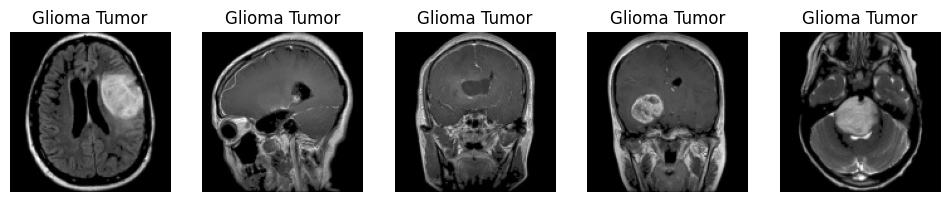

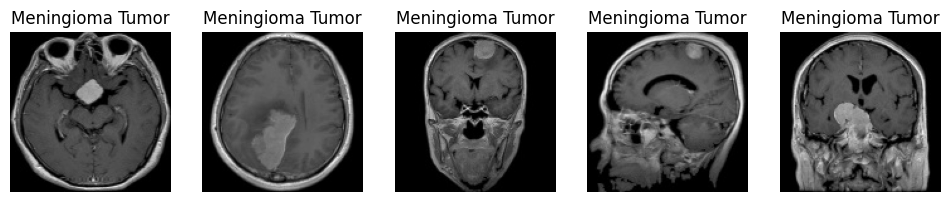

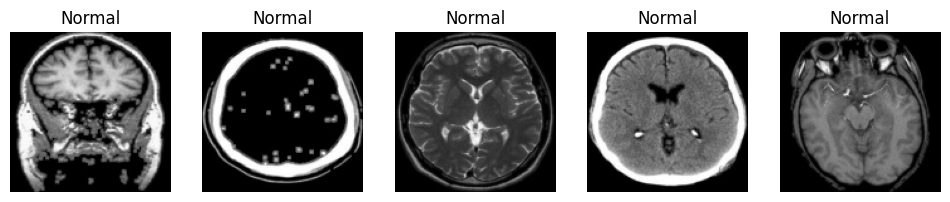

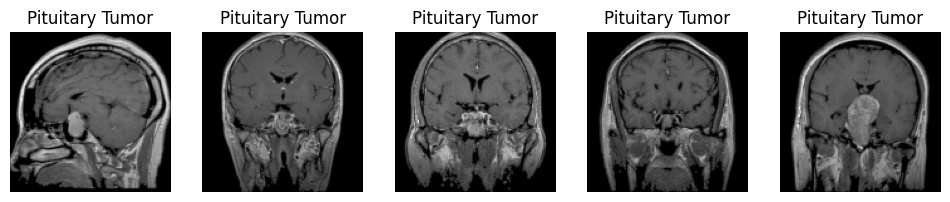

In [33]:
def display_sample_images(image_dir, title, num_samples=5):
    plt.figure(figsize=(12, 4))
    image_paths = [os.path.join(image_dir, img) for img in os.listdir(image_dir)[:num_samples]]
    for i, image_path in enumerate(image_paths):
        img = mpimg.imread(image_path)
        plt.subplot(1, num_samples, i+1)
        plt.imshow(img, cmap='gray')
        plt.title(title)
        plt.axis('off')
    plt.show()

display_sample_images(glioma_tumor_dir, 'Glioma Tumor')
display_sample_images(meningioma_tumor_dir, 'Meningioma Tumor')
display_sample_images(normal_dir, 'Normal')
display_sample_images(pituitary_tumor_dir, 'Pituitary Tumor')

### Model Building and training:

In [52]:
model_GAN = ConditionalDCGAN(input_shape=(img_size, img_size, 3), latent_dim=latent_dim, num_classes=4)
model_GAN.compile(d_optimizer=Adam(learning_rate=0.0002, beta_1=0.5),
              g_optimizer=Adam(learning_rate=0.0002, beta_1=0.5),
              loss_fn=BinaryCrossentropy())

In [53]:
visualizer = ConditionalGANVisualization(labels=labels, n_epochs=5)

Epoch 1/50
97/97 [==============================] - 21s 122ms/step - d_loss: 0.6159 - g_loss: 2.9658
Epoch 2/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.3911 - g_loss: 2.1658
Epoch 3/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.3905 - g_loss: 2.2709
Epoch 4/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.4093 - g_loss: 2.3129
Epoch 5/50
97/97 [==============================] - ETA: 0s - d_loss: 0.4658 - g_loss: 1.8215
Epoch: 5, Generated images from randomly sampled latent vectors and labels



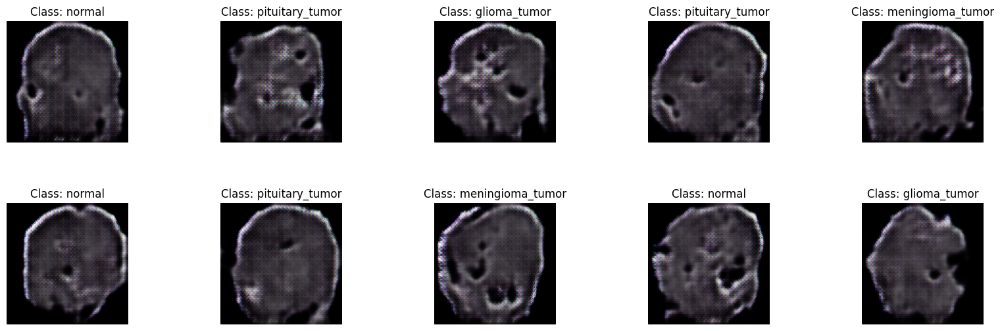

97/97 [==============================] - 11s 110ms/step - d_loss: 0.4658 - g_loss: 1.8215
Epoch 6/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.4632 - g_loss: 1.8676
Epoch 7/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.4353 - g_loss: 1.7987
Epoch 8/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.4110 - g_loss: 2.0363
Epoch 9/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.3609 - g_loss: 2.1336
Epoch 10/50
97/97 [==============================] - ETA: 0s - d_loss: 0.3532 - g_loss: 2.2035
Epoch: 10, Generated images from randomly sampled latent vectors and labels



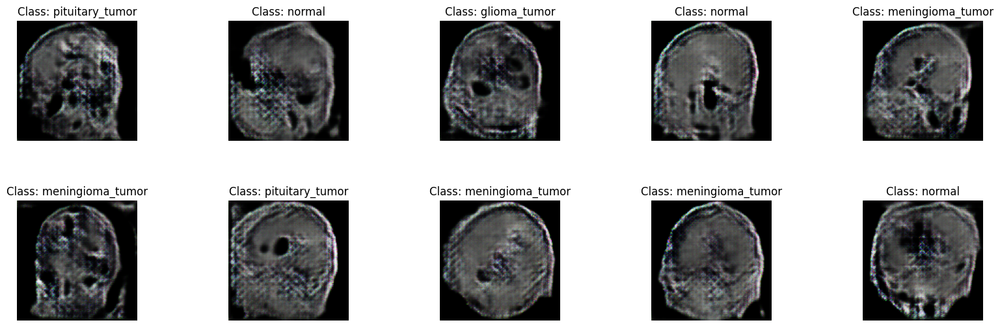

97/97 [==============================] - 11s 109ms/step - d_loss: 0.3532 - g_loss: 2.2035
Epoch 11/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.3193 - g_loss: 2.3773
Epoch 12/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.3158 - g_loss: 2.3976
Epoch 13/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.3239 - g_loss: 2.3197
Epoch 14/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.3376 - g_loss: 2.3369
Epoch 15/50
97/97 [==============================] - ETA: 0s - d_loss: 0.3199 - g_loss: 2.3479
Epoch: 15, Generated images from randomly sampled latent vectors and labels



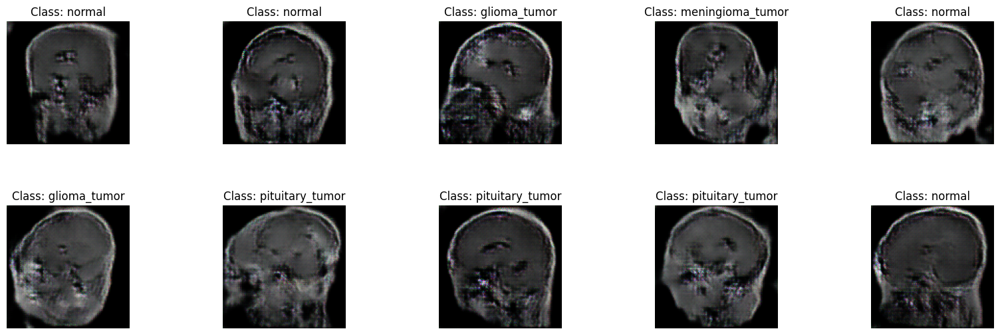

97/97 [==============================] - 11s 108ms/step - d_loss: 0.3199 - g_loss: 2.3479
Epoch 16/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.3244 - g_loss: 2.3996
Epoch 17/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.3216 - g_loss: 2.4790
Epoch 18/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.3063 - g_loss: 2.5634
Epoch 19/50
97/97 [==============================] - 10s 99ms/step - d_loss: 0.3143 - g_loss: 2.5820
Epoch 20/50
97/97 [==============================] - ETA: 0s - d_loss: 0.3155 - g_loss: 2.6170
Epoch: 20, Generated images from randomly sampled latent vectors and labels



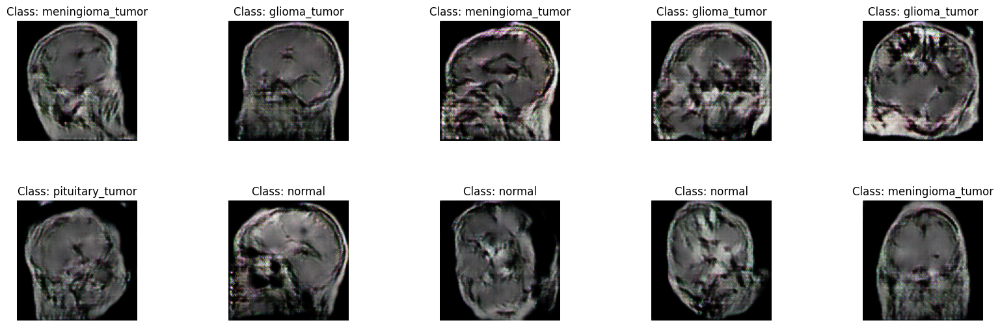

97/97 [==============================] - 11s 114ms/step - d_loss: 0.3155 - g_loss: 2.6170
Epoch 21/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.3110 - g_loss: 2.7124
Epoch 22/50
97/97 [==============================] - 10s 99ms/step - d_loss: 0.2979 - g_loss: 2.8130
Epoch 23/50
97/97 [==============================] - 10s 99ms/step - d_loss: 0.3119 - g_loss: 2.8927
Epoch 24/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.2724 - g_loss: 2.9504
Epoch 25/50
97/97 [==============================] - ETA: 0s - d_loss: 0.2797 - g_loss: 3.1219
Epoch: 25, Generated images from randomly sampled latent vectors and labels



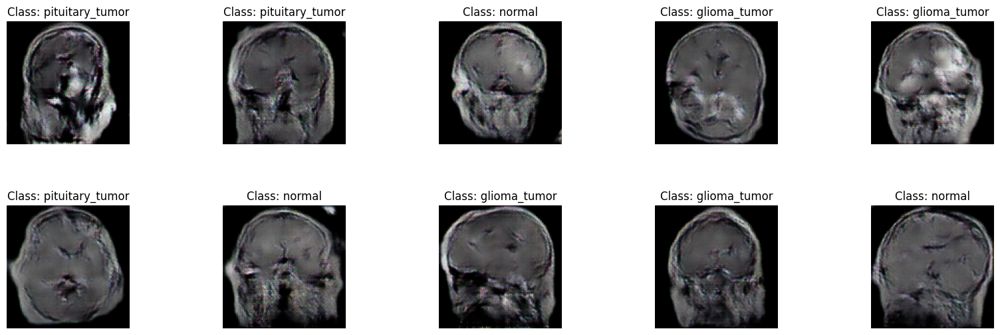

97/97 [==============================] - 11s 108ms/step - d_loss: 0.2797 - g_loss: 3.1219
Epoch 26/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.2762 - g_loss: 3.1761
Epoch 27/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.2611 - g_loss: 3.3177
Epoch 28/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.2559 - g_loss: 3.4405
Epoch 29/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.2376 - g_loss: 3.5126
Epoch 30/50
97/97 [==============================] - ETA: 0s - d_loss: 0.2168 - g_loss: 3.7564
Epoch: 30, Generated images from randomly sampled latent vectors and labels



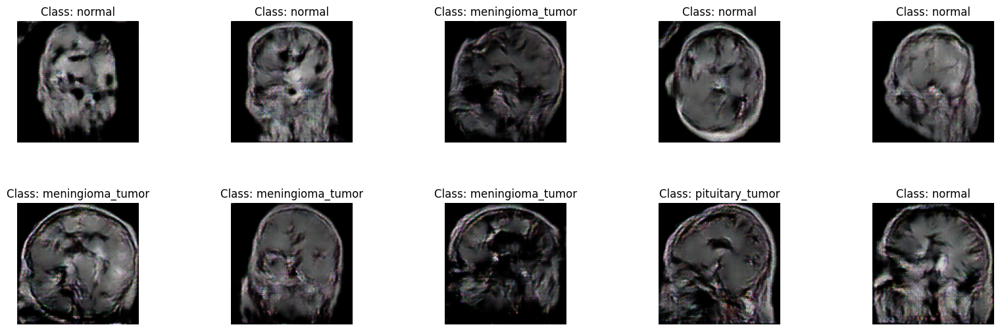

97/97 [==============================] - 11s 109ms/step - d_loss: 0.2168 - g_loss: 3.7564
Epoch 31/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.2767 - g_loss: 3.5040
Epoch 32/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.2078 - g_loss: 3.8813
Epoch 33/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.2081 - g_loss: 3.9735
Epoch 34/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.1897 - g_loss: 4.1246
Epoch 35/50
97/97 [==============================] - ETA: 0s - d_loss: 0.1973 - g_loss: 4.3539
Epoch: 35, Generated images from randomly sampled latent vectors and labels



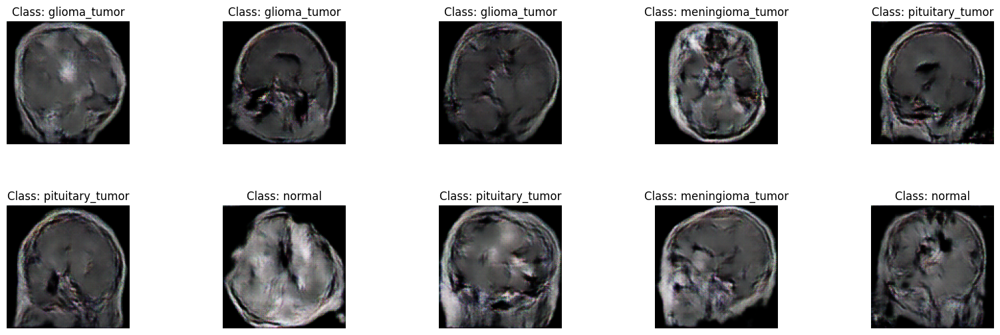

97/97 [==============================] - 11s 110ms/step - d_loss: 0.1973 - g_loss: 4.3539
Epoch 36/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.1763 - g_loss: 4.5175
Epoch 37/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.1856 - g_loss: 4.5785
Epoch 38/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.1631 - g_loss: 4.6284
Epoch 39/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.1900 - g_loss: 4.8646
Epoch 40/50
97/97 [==============================] - ETA: 0s - d_loss: 0.2088 - g_loss: 4.3054
Epoch: 40, Generated images from randomly sampled latent vectors and labels



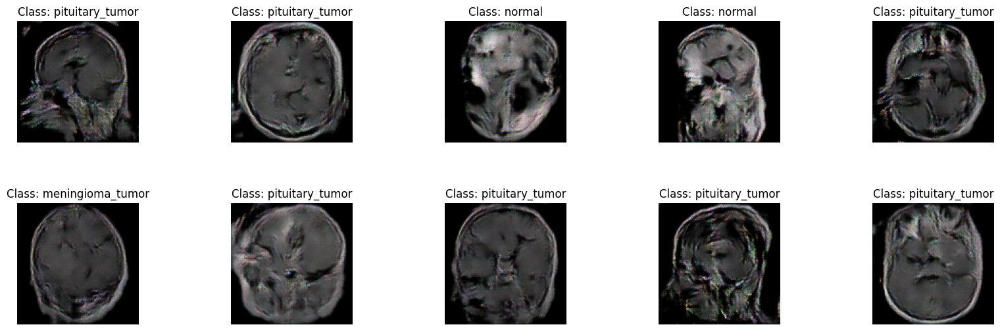

97/97 [==============================] - 11s 110ms/step - d_loss: 0.2088 - g_loss: 4.3054
Epoch 41/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.1681 - g_loss: 4.7447
Epoch 42/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.1479 - g_loss: 4.8750
Epoch 43/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.1572 - g_loss: 5.0858
Epoch 44/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.1480 - g_loss: 5.1493
Epoch 45/50
97/97 [==============================] - ETA: 0s - d_loss: 0.1508 - g_loss: 5.1934
Epoch: 45, Generated images from randomly sampled latent vectors and labels



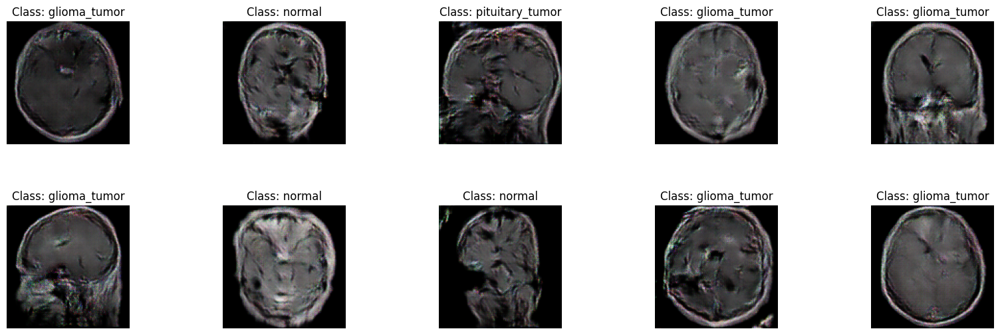

97/97 [==============================] - 11s 109ms/step - d_loss: 0.1508 - g_loss: 5.1934
Epoch 46/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.1519 - g_loss: 5.2242
Epoch 47/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.1310 - g_loss: 5.4519
Epoch 48/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.1210 - g_loss: 5.5476
Epoch 49/50
97/97 [==============================] - 10s 100ms/step - d_loss: 0.1788 - g_loss: 5.5098
Epoch 50/50
97/97 [==============================] - ETA: 0s - d_loss: 0.1087 - g_loss: 5.4207
Epoch: 50, Generated images from randomly sampled latent vectors and labels



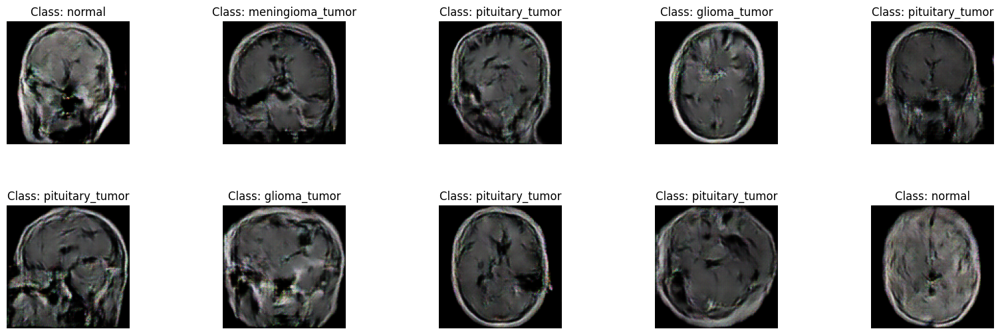

97/97 [==============================] - 11s 109ms/step - d_loss: 0.1087 - g_loss: 5.4207


In [54]:
model_GAN.fit(data_generator, epochs=50, callbacks=[visualizer])

In [55]:
model_GAN.save_weights('gan_weights.h5')

In [56]:
model_GAN.summary()


Model: "model_18"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_38 (InputLayer)          [(None, 1)]          0           []                               
                                                                                                  
 embedding_18 (Embedding)       (None, 1, 50)        200         ['input_38[0][0]']               
                                                                                                  
 dense_37 (Dense)               (None, 1, 16384)     835584      ['embedding_18[0][0]']           
                                                                                                  
 input_39 (InputLayer)          [(None, 128, 128, 3  0           []                               
                                )]                                                         

### Generating and saving the images:

In [57]:
# Mapping dictionary
label_mapping = {
    0: 'pituitary_tumor',
    1: 'normal',
    2: 'glioma_tumor',
    3: 'meningioma_tumor'
}

In [58]:
import numpy as np

num_samples = 10000  # Number of images you want to generate
latent_dim = 256  # Should match the latent_dim used during training
num_classes = 4  # Number of classes in your dataset

# Generate random latent vectors and labels
random_latent_vectors = np.random.normal(size=(num_samples, latent_dim))
random_labels = np.random.randint(0, num_classes, size=(num_samples, 1))

# Mapping random labels to tumor types using the mapping dictionary
mapped_labels = [label_mapping[label] for label in random_labels.flatten()]
generated_images = model_GAN.generator.predict([random_latent_vectors, random_labels])


313/313 [==============================] - 5s 15ms/step


In [59]:
from PIL import Image

# Function to save an image to a specific path
def save_image(image, path):
    # Scale the image back to [0, 255] range
    image = (image * 0.5 + 0.5) * 255
    # Convert the image array to uint8 data type
    image = image.astype('uint8')
    # Create an image object from the array
    image = Image.fromarray(image)
    # Save the image as PNG format
    image.save(path)

# Directory to save generated images
save_dir = 'generated_images/'

# Create class folders if they don't exist
for label in label_mapping.values():
    class_dir = os.path.join(save_dir, label)
    os.makedirs(class_dir, exist_ok=True)

# Save generated images in class folders
for i in range(num_samples):
    # Get the mapped label for the current generated image
    mapped_label = mapped_labels[i]
    
    # Save the image with mapped label in the corresponding class folder
    class_dir = os.path.join(save_dir, mapped_label)
    filename = f'generated_{i}.png'
    image_path = os.path.join(class_dir, filename)
    
    # Save the generated image
    save_image(generated_images[i], image_path)


### Combining the generated images with the original dataset

In [60]:
import os
import shutil

# Define the source directories
source_directory1 = "/kaggle/working/saved"
source_directory2 = "/kaggle/working/generated_images"

# Define the target directory where you want to create the combined structure
target_directory = "/kaggle/working/combined_directory"

# Create the target directories for the four different classes
classes = ["normal", "meningioma_tumor", "glioma_tumor", "pituitary_tumor"]
for class_name in classes:
    os.makedirs(os.path.join(target_directory, class_name), exist_ok=True)

# Iterate through the source directories and copy the files to the target directories
for source_dir in [source_directory1, source_directory2]:
    for class_name in classes:
        source_class_dir = os.path.join(source_dir, class_name)
        target_class_dir = os.path.join(target_directory, class_name)
        
        # Ensure the source class directory exists
        if os.path.exists(source_class_dir):
            # Copy files from the source to the target directory
            for filename in os.listdir(source_class_dir):
                source_file = os.path.join(source_class_dir, filename)
                target_file = os.path.join(target_class_dir, filename)
                shutil.copy(source_file, target_file)

print("Files have been successfully copied to the combined directory.")


Files have been successfully copied to the combined directory.


### Visualising images from the combined directory

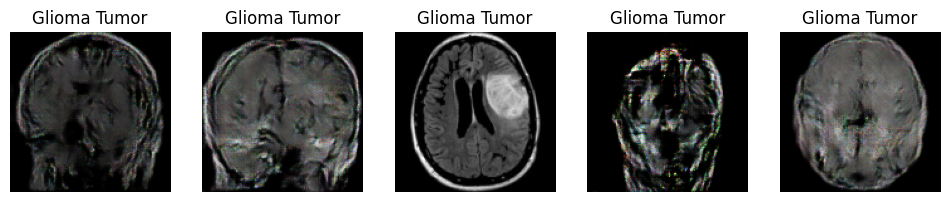

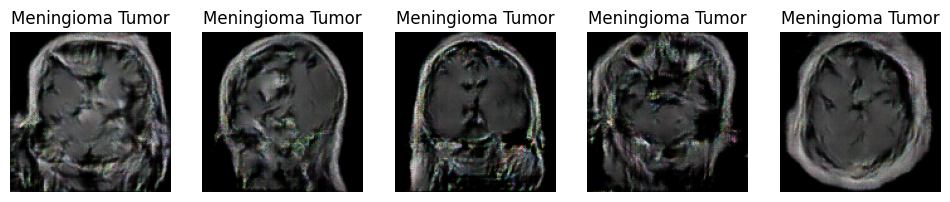

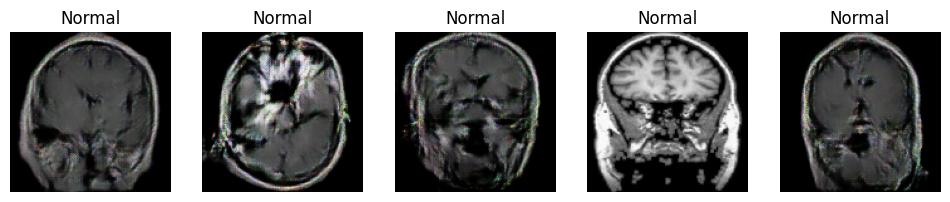

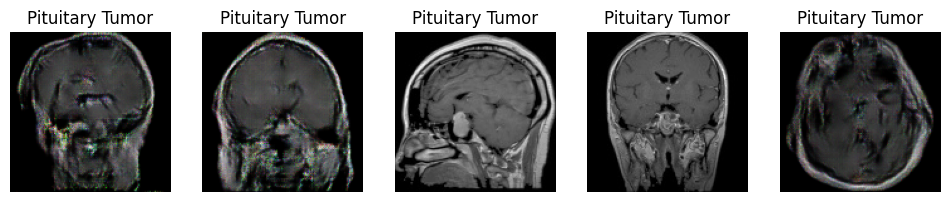

In [61]:
def display_sample_images(image_dir, title, num_samples=5):
    plt.figure(figsize=(12, 4))
    image_paths = [os.path.join(image_dir, img) for img in os.listdir(image_dir)[:num_samples]]
    for i, image_path in enumerate(image_paths):
        img = mpimg.imread(image_path)
        plt.subplot(1, num_samples, i+1)
        plt.imshow(img, cmap='gray')
        plt.title(title)
        plt.axis('off')
    plt.show()

display_sample_images('/kaggle/working/combined_directory/glioma_tumor', 'Glioma Tumor')
display_sample_images('/kaggle/working/combined_directory/meningioma_tumor', 'Meningioma Tumor')
display_sample_images('/kaggle/working/combined_directory/normal', 'Normal')
display_sample_images('/kaggle/working/combined_directory/pituitary_tumor', 'Pituitary Tumor')

## Part 3: Image classification using augmented data:

In [81]:
combined_directory = '/kaggle/working/combined_directory'


In [82]:
# Lets create the Training data 
image_directory=combined_directory
batch_size = 32
img_height = 128
img_width = 128
train_data_2 = tf.keras.utils.image_dataset_from_directory(image_directory,
                                                         validation_split=0.2,
                                                         seed=123,
                                                         subset="training",
                                                         image_size=(img_height, img_width),
                                                         batch_size=batch_size)

Found 13096 files belonging to 4 classes.
Using 10477 files for training.


In [83]:
# Lets create the Validation data 
val_data_2 = tf.keras.utils.image_dataset_from_directory(image_directory,
                                                       validation_split=0.2,
                                                       subset="validation",
                                                       seed=123,
                                                       image_size=(img_height, img_width),
                                                       batch_size=batch_size)

Found 13096 files belonging to 4 classes.
Using 2619 files for validation.


###     Using the same resnet50 model:

In [65]:
base_model =tf.keras.applications.resnet.ResNet50(include_top=False)
for layer in base_model.layers[:15]:
    layer.trainable=False
inputs = tf.keras.layers.Input(shape=(128, 128,3), name="input_layer")

In [66]:
x = base_model(inputs)
print(f"Shape after base_model: {x.shape}")

Shape after base_model: (None, 4, 4, 2048)


In [67]:
 #Average pool the outputs of the base model (aggregate all the most important information, reduce number of computations)
x = tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)
x=tf.keras.layers.Flatten()(x)
x=tf.keras.layers.Dense(512, activation="relu")(x)
x=tf.keras.layers.Dropout(0.5)(x)
outputs=tf.keras.layers.Dense(4, activation="softmax",name="output_layer")(x)
model_2= tf.keras.Model(inputs, outputs, name="model")


In [68]:
# Compile the model
model_2.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(), # different loss function for multiclass classifcation
              optimizer=tf.keras.optimizers.Adam(lr=0.001),
              metrics=["accuracy"]
             )

In [69]:
history2= model_2.fit(train_data_2, epochs=20, validation_data= val_data_2,callbacks=[Early_Stopping,learning_rate_reduction], verbose=1)


Epoch 1/20
78/78 [==============================] - 42s 95ms/step - loss: 0.8174 - accuracy: 0.7549 - val_loss: 1.4164 - val_accuracy: 0.7706 - lr: 0.0010
Epoch 2/20
78/78 [==============================] - 6s 77ms/step - loss: 0.3337 - accuracy: 0.8890 - val_loss: 2.0472 - val_accuracy: 0.7157 - lr: 0.0010
Epoch 3/20
78/78 [==============================] - 6s 78ms/step - loss: 0.2323 - accuracy: 0.9213 - val_loss: 0.8751 - val_accuracy: 0.7496 - lr: 0.0010
Epoch 4/20
78/78 [==============================] - 6s 77ms/step - loss: 0.2917 - accuracy: 0.9092 - val_loss: 1.3183 - val_accuracy: 0.8174 - lr: 0.0010
Epoch 5/20
78/78 [==============================] - 6s 79ms/step - loss: 0.1778 - accuracy: 0.9447 - val_loss: 0.6392 - val_accuracy: 0.8401 - lr: 0.0010
Epoch 6/20
78/78 [==============================] - 6s 79ms/step - loss: 0.1314 - accuracy: 0.9608 - val_loss: 0.5445 - val_accuracy: 0.8643 - lr: 0.0010
Epoch 7/20
78/78 [==============================] - 6s 80ms/step - loss: 0.

In [80]:
model_2.save('model_2.h5')

### Model Evaluation

In [70]:
model_2.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 128, 128, 3)]     0         
                                                                 
 resnet50 (Functional)       (None, None, None, 2048)  23587712  
                                                                 
 global_average_pooling_laye  (None, 2048)             0         
 r (GlobalAveragePooling2D)                                      
                                                                 
 flatten_11 (Flatten)        (None, 2048)              0         
                                                                 
 dense_41 (Dense)            (None, 512)               1049088   
                                                                 
 dropout_11 (Dropout)        (None, 512)               0         
                                                             

In [71]:
loss, accuracy= model_2.evaluate(val_data_2)
print(f"loss is:{loss}")
print(f"accuacy is:{accuracy}")

20/20 [==============================] - 1s 26ms/step - loss: 0.2201 - accuracy: 0.9435
loss is:0.22012482583522797
accuacy is:0.9434571862220764


In [72]:
history_resnet50= pd.DataFrame(history2.history)
history_resnet50.tail()

,loss,accuracy,val_loss,val_accuracy,lr
11,0.021402,0.994348,0.477543,0.893376,0.000500
12,0.013503,0.995155,0.290341,0.940226,0.000500
13,0.003258,0.999596,0.266628,0.940226,0.000250
14,0.001557,0.999596,0.265674,0.943457,0.000250
15,0.003640,0.998385,0.276976,0.940226,0.000125


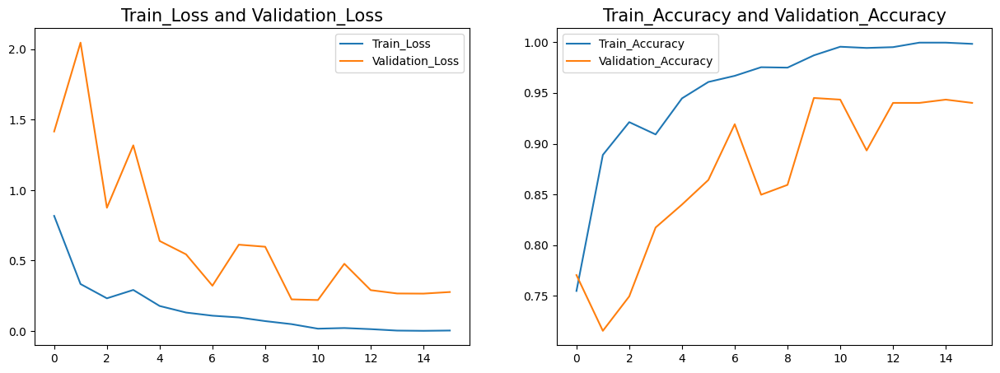

In [73]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(history_resnet50['loss'],label='Train_Loss')
plt.plot(history_resnet50['val_loss'],label='Validation_Loss')
plt.title('Train_Loss and Validation_Loss',fontsize=15)
plt.legend()


plt.subplot(1,2,2)
plt.plot(history_resnet50['accuracy'],label='Train_Accuracy')
plt.plot(history_resnet50['val_accuracy'],label='Validation_Accuracy')
plt.title('Train_Accuracy and Validation_Accuracy',fontsize=15)
plt.legend()
plt.show()

In [74]:
x_val=[]
y_val=[]
y_pred=[]

for images, labels in val_data:
    x_val.extend(images.numpy())
    y_val.extend(labels.numpy())
    

predictions=model_2.predict(np.array(x_val))
for i in predictions:
    y_pred.append(np.argmax(i))

20/20 [==============================] - 1s 22ms/step


# 

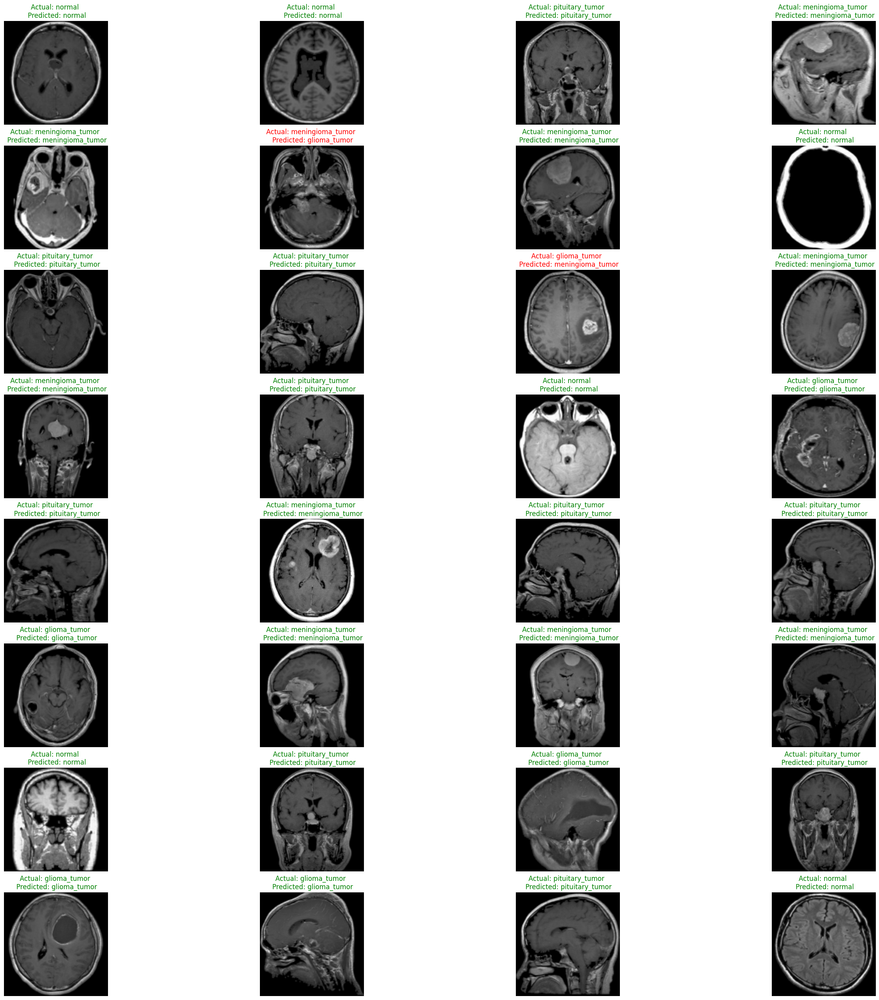

In [75]:
plt.figure(figsize=(32, 32))

for i in range(32):
    ax = plt.subplot(8, 4, i + 1)
    plt.imshow(x_val[i].astype("uint8"))
    actual_label = class_names[y_val[i]]
    predicted_label = class_names[y_pred[i]]
    
    # Check if the actual and predicted labels are the same
    if actual_label == predicted_label:
        label_color = 'green'
    else:
        label_color = 'red'
    
    plt.title(f'Actual: {actual_label} \n Predicted: {predicted_label}', color=label_color)
    plt.axis("off")

plt.show()


F1-Score:[0.9463199833865255]
Precision:[0.9500269776583435]
Recall:[0.9438563098583039]
Classification_Report
-----------------------
              precision    recall  f1-score   support

           0       0.96      0.89      0.93       184
           1       0.91      0.95      0.93       179
           2       0.94      0.99      0.96        81
           3       0.96      0.97      0.97       175

    accuracy                           0.94       619
   macro avg       0.94      0.95      0.95       619
weighted avg       0.94      0.94      0.94       619

Confusion_Matrix
----------------------


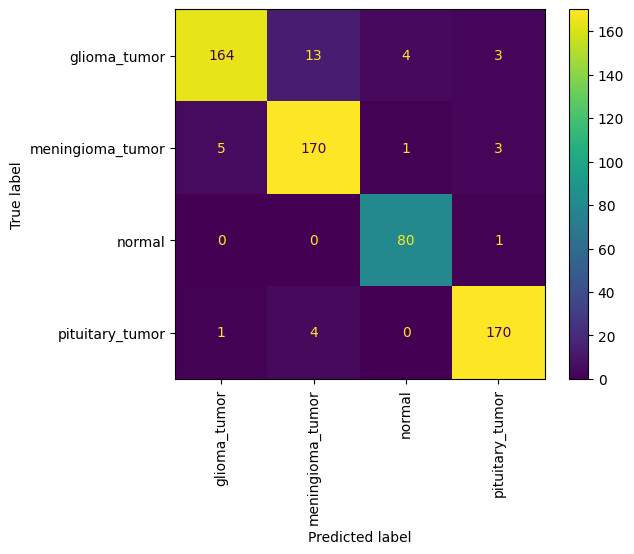

In [76]:
f1_scores=[]
precision_scores=[]
recall_scores=[]

f1_scores.append(f1_score(y_pred, y_val, average="macro"))
precision_scores.append(precision_score(y_pred, y_val, average="macro"))
recall_scores.append(recall_score(y_pred, y_val, average="macro"))


# Print the Results
print(f"F1-Score:{f1_scores}")
print(f"Precision:{precision_scores}")
print(f"Recall:{recall_scores}")




print("Classification_Report")
print("-----------------------")
print(classification_report(y_val,y_pred))
print("Confusion_Matrix")
print("----------------------")
ConfusionMatrixDisplay.from_predictions(y_val, y_pred, display_labels=class_names, xticks_rotation="vertical")
plt.show()

In [77]:
from sklearn.metrics import confusion_matrix

# Get the confusion matrix as a DataFrame
dataframe= pd.DataFrame(confusion_matrix(y_val, y_pred), columns=class_names, index=class_names)

# Print the DataFrame
print(dataframe)

                  glioma_tumor  meningioma_tumor  normal  pituitary_tumor
glioma_tumor               164                13       4                3
meningioma_tumor             5               170       1                3
normal                       0                 0      80                1
pituitary_tumor              1                 4       0              170


In [78]:
model_name=["ResNet50"]
result_df= pd.DataFrame({"F1_Score":f1_scores, "Precision_Score":precision_scores, "Recall_Score":recall_scores}, index=model_name)
result_df= result_df.T.sort_values(by="ResNet50", ascending=False)
result_df

,ResNet50
Precision_Score,0.950027
F1_Score,0.946320
Recall_Score,0.943856


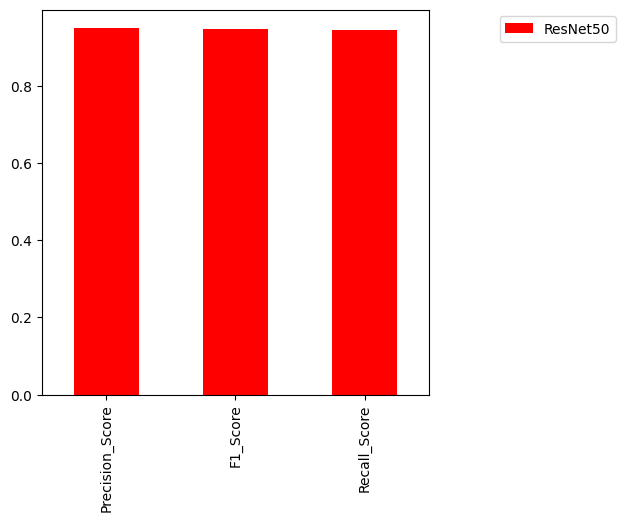

In [79]:
result_df.plot(kind="bar",figsize=(5,5), color="red").legend(bbox_to_anchor=(1.5,1))

> 1. In this case, **Recall gets higher importance than the Precision**. Beacuse,if our model predicts the False Neagtive which means the person has not a Brain Tumor, but actually it has a Brain Tumor, then it will become more dangerous to the health of person.Hence,by minimizing the False Negative we can get higher Recall.
2. Recall is defined as Out of Total Prediceted Labels how many Did we predict correctly.
3. **Recall = True Positive/(True Positive + False Negative)**